In [ ]:
!pip install 'networkx<2.7'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 5.5 MB/s 
  Attempting uninstall: networkx
    Found existing installation: networkx 2.8.8
    Uninstalling networkx-2.8.8:
      Successfully uninstalled networkx-2.8.8


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 2022.csv to 2022.csv
Saving 2021.csv to 2021.csv
Saving 2020.csv to 2020.csv
Saving 2019.csv to 2019.csv
Saving 2018.csv to 2018.csv
Saving 2017.csv to 2017.csv


In [ ]:
# importing package
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import wordpunct_tokenize
import matplotlib.pyplot as plt
import networkx as nx
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

## Data process

In [ ]:
# reading datasets
df1 = pd.read_csv('2017.csv')
df2 = pd.read_csv('2018.csv')
df3 = pd.read_csv('2019.csv')
df4 = pd.read_csv('2020.csv')
df5 = pd.read_csv('2021.csv')
df6 = pd.read_csv('2022.csv')
data = pd.concat([df1,df2,df3,df4,df5,df6])
data

,Unnamed: 0,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,...,reply_to,retweet_date,translate,trans_src,trans_dest,time,mentions,replies_count,retweets_count,likes_count
0,0.0,945814723521417217,945712432416137217,1514334777000.0,2017-12-27 00:32:57,0,NaN,@neilsiegel @Tesla Coming very soon,en,[],...,"[{'screen_name': 'neilsiegel', 'name': 'Neil S...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,945749747129659392,945712432416137217,1514319285000.0,2017-12-26 20:14:45,0,NaN,@Kreative Vastly better maps/nav coming soon,en,[],...,"[{'screen_name': 'Kreative', 'name': 'Leslie',...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.0,945748731197980672,945712432416137217,1514319043000.0,2017-12-26 20:10:43,0,NaN,@dd_hogan Ok,und,[],...,"[{'screen_name': 'dd_hogan', 'name': 'Live4EVD...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3.0,945730195113365504,945727773493968896,1514314623000.0,2017-12-26 18:57:03,0,NaN,@Jason @Tesla Sure,en,[],...,"[{'screen_name': 'Jason', 'name': 'jason@calac...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4.0,945729852874694656,945712432416137217,1514314542000.0,2017-12-26 18:55:42,0,NaN,"@kabirakhtar Yeah, it’s terrible. Had to upgra...",en,[],...,"[{'screen_name': 'kabirakhtar', 'name': 'kabir...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1023,NaN,1477775713172402176,1477775713172402176,2022-01-03 02:56:00 Arabian Standard Time,2022-01-03,400,NaN,https://t.co/LA9hPzVlGx,und,[],...,[],NaN,NaN,NaN,NaN,02:56:00,[],25611.0,51383.0,473530.0
1024,NaN,1477706142461706248,1477706142461706248,2022-01-02 22:19:33 Arabian Standard Time,2022-01-02,400,NaN,Let’s make the roaring 20’s happen!,en,[],...,[],NaN,NaN,NaN,NaN,22:19:33,[],22500.0,26951.0,320201.0
1025,NaN,1477700424933253123,1477700424933253123,2022-01-02 21:56:50 Arabian Standard Time,2022-01-02,400,NaN,Great work by Tesla team worldwide!,en,[],...,[],NaN,NaN,NaN,NaN,21:56:50,[],5630.0,4459.0,66405.0
1026,NaN,1477096955658579974,1476958174439567360,2022-01-01 05:58:52 Arabian Standard Time,2022-01-01,400,NaN,@BLKMDL3 @Tesla 🔥,und,[],...,"[{'screen_name': 'BLKMDL3', 'name': 'Zack', 'i...",NaN,NaN,NaN,NaN,05:58:52,[],1074.0,472.0,45704.0


In [ ]:
data = data.loc[:,['date','tweet']]
data['date'] = pd.to_datetime(data['date'])
data['year'] = data['date'].dt.year
data

,date,tweet,year
0,2017-12-27 00:32:57,@neilsiegel @Tesla Coming very soon,2017
1,2017-12-26 20:14:45,@Kreative Vastly better maps/nav coming soon,2017
2,2017-12-26 20:10:43,@dd_hogan Ok,2017
3,2017-12-26 18:57:03,@Jason @Tesla Sure,2017
4,2017-12-26 18:55:42,"@kabirakhtar Yeah, it’s terrible. Had to upgra...",2017
...,...,...,...
1023,2022-01-03 00:00:00,https://t.co/LA9hPzVlGx,2022
1024,2022-01-02 00:00:00,Let’s make the roaring 20’s happen!,2022
1025,2022-01-02 00:00:00,Great work by Tesla team worldwide!,2022
1026,2022-01-01 00:00:00,@BLKMDL3 @Tesla 🔥,2022


## Word frequency function

In [ ]:
# word frequency
def wordfre(data,year):
    data1 = data[data['year']==year]
    stop = set(stopwords.words('english'))
    other = ["http","https", ".", "!", "?", ",", ";", ":", "-", "[", "]", "{", "}", "(", ")", "/", "*", "~", "<", ">", "`", "^", "_", "|", "#", "$", "%", "+", "=", "&", "@", " "]
    wordf =[]
    wordfrequency = pd.DataFrame()
    for i in range(len(data1)):
        word = word_tokenize(data1.iloc[i]['tweet'])
        for j in range(len(word)):
            if word[j].lower() not in stop and word[j].lower() not in other and word[j].lower().isalpha():
               wordf.append(word[j].lower())
    wordfrequency['word'] = wordf
    wordfrequency = wordfrequency.reset_index()


    frequency = wordfrequency.groupby('word').count()

    frequency = pd.DataFrame(frequency)
    frequency = frequency.reset_index()
    frequency = frequency.rename(columns={'index':'count'})
    frequency = frequency.sort_values('count',ascending=False)
    return frequency



In [ ]:
#function for Zipf's law
def zip(data):
    a = data
    a = a.reset_index().reset_index().drop('index', axis = 1).rename(columns = {'level_0':'rank'})
    a['rank'] = a['rank']+1
    a['frequency'] = a['count']/sum(a['count'])

    return a

In [ ]:
#Function for loglog plot
def drawlog(data):
    fig = plt.figure(figsize = (10,10))
    ax = plt.subplot(111)

    ax.plot(data['rank'],data['frequency'])
    ax.set_xlabel('rank')
    ax.set_ylabel('frequency')
    ax.set_xscale('log')
    ax.set_yscale('log')
    plt.show()
 

In [ ]:
#fuction defining bigram 
def bigcount(data,year):
    data1 = data[data['year']==year]
    stop = set(stopwords.words('english'))
    pattern = '|'.join(stop)
    
    other = ["http","https", ".", "!", "?", ",", ";", ":", "-", "[", "]", "{", "}", "(", ")", "/", "*", "~", "<", ">", "`", "^", "_", "|", "#", "$", "%", "+", "=", "&", "@", " "]
    p2 = '|'.join(other)
    wordf =[]
    bia =[]
    word1 =[]
    word2 =[]
    bigramsl = pd.DataFrame()
    for i in range(len(data1)):
        word = word_tokenize(data1.iloc[i]['tweet'])
        bi = list(nltk.bigrams(word))
        bia = bia+bi
    for j in range(len(bia)):
        word1.append(bia[j][0])
        word2.append(bia[j][1])

    bigramsl['word1'] = word1
    bigramsl['word2'] = word2
    # without stop word
    bigramsl = bigramsl[~bigramsl['word1'].str.contains(pattern)&bigramsl['word1'].str.contains('[A-Za-z]')&~bigramsl['word1'].str.contains(pattern)& bigramsl['word2'].str.contains('[A-Za-z]')]
    bigramsl = bigramsl.reset_index()
    frequency = bigramsl.groupby(['word1','word2']).count()

    frequency = pd.DataFrame(frequency)
    frequency = frequency.reset_index()
    frequency = frequency.rename(columns={'index':'count'})
    frequency = frequency.sort_values('count',ascending=False)
        
    return frequency




In [ ]:
def bivi(data):
    G = nx.Graph()
    for i in range(len(data)):
        G.add_edge(data.iloc[i,0], data.iloc[i,1], weight=data.iloc[i,2])

    fig, ax = plt.subplots(figsize=(20, 20))
    pos = nx.spring_layout(G,k = 2)
    nx.draw(G,pos, with_labels=True, node_size=25)
    plt.show()




### 2017

In [ ]:
# year 2017

wordfre(data,2017)

,word,count
131,amp,267
3114,tesla,240
1975,model,177
3509,yes,162
1305,good,159
...,...,...
1461,iainthomson,3
1462,iamdeveloper,3
1463,iamsamcrompton,3
1464,ianrosswins,3


In [ ]:
# top 10
wordfre(data,2017)[:10]


,word,count
131,amp,267
3114,tesla,240
1975,model,177
3509,yes,162
1305,good,159
2898,spacex,156
1760,like,147
2136,one,138
1158,first,126
2066,next,123


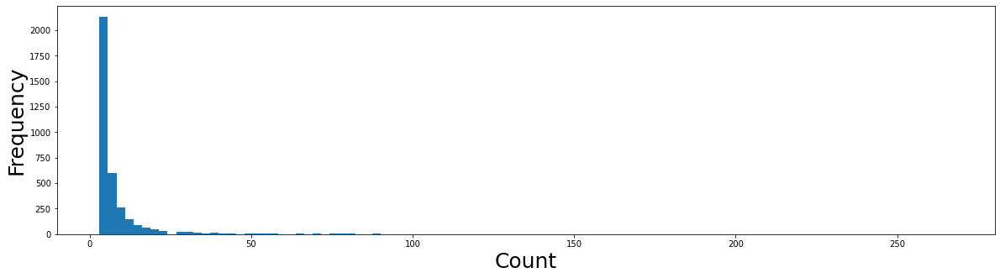

In [ ]:
# hist
a = wordfre(data,2017)
fig, ax = plt.subplots(figsize=(20,5))
ax.hist(a['count'],100 )
ax.set_xlabel("Count",fontsize=25 )
ax.set_ylabel("Frequency",fontsize=25)
plt.show()

In [ ]:
# zip laws
a = wordfre(data,2017)
zip(a)

,rank,word,count,frequency
0,1,amp,267,0.009876
1,2,tesla,240,0.008877
2,3,model,177,0.006547
3,4,yes,162,0.005992
4,5,good,159,0.005881
...,...,...,...,...
3522,3523,iainthomson,3,0.000111
3523,3524,iamdeveloper,3,0.000111
3524,3525,iamsamcrompton,3,0.000111
3525,3526,ianrosswins,3,0.000111


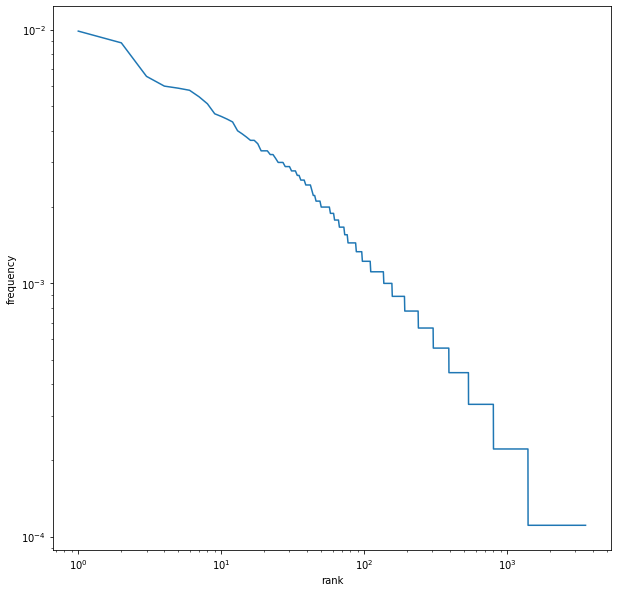

In [ ]:
# plot log-log
a = zip(a)
drawlog(a)

In [ ]:
# bigrams
# count
bigcount(data,2017)

,word1,word2,count
109,I,'m,57
143,I,love,33
165,I,think,33
110,I,'ve,30
128,I,do,24
...,...,...,...
160,I,sign,3
159,I,should,3
158,I,share,3
156,I,promise,3


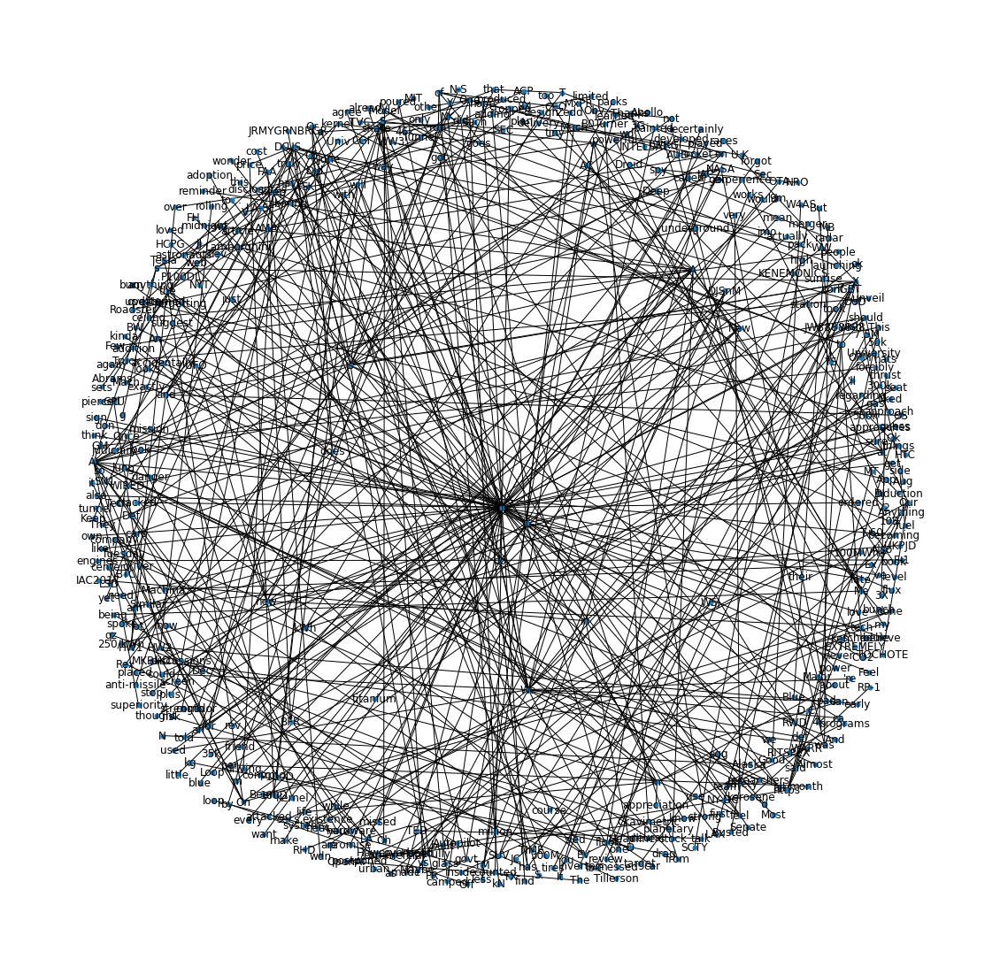

In [ ]:
# visualization
a = bigcount(data,2017)
bivi(a)

### 2018

In [ ]:
# year 2018 word count
wordfre(data,2018)

,word,count
202,amp,1581
5330,tesla,1354
787,car,360
6048,yes,324
2230,good,305
...,...,...
2645,intentions,3
2646,interchanges,3
2651,intergalactic,3
2654,internal,3


In [ ]:
# top 10
wordfre(data,2018)[:10]


,word,count
202,amp,1581
5330,tesla,1354
787,car,360
6048,yes,324
2230,good,305
3399,model,294
3038,like,282
4974,spacex,264
6012,would,231
3866,people,222


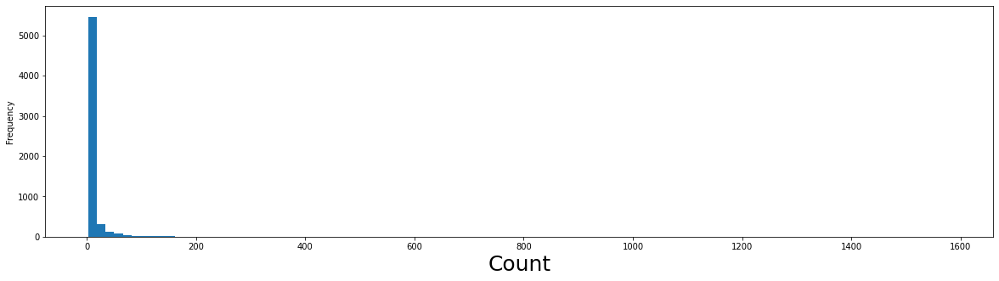

In [ ]:
# hist
a = wordfre(data,2018)
fig, ax = plt.subplots(figsize=(20,5))
ax.hist(a['count'],100 )
ax.set_xlabel("Count",fontsize=25 )
ax.set_ylabel("Frequency")
plt.show()

In [ ]:
# zip laws
a = wordfre(data,2018)
zip(a)

,rank,word,count,frequency
0,1,amp,1581,0.025024
1,2,tesla,1354,0.021431
2,3,car,360,0.005698
3,4,yes,324,0.005128
4,5,good,305,0.004828
...,...,...,...,...
6079,6080,intentions,3,0.000047
6080,6081,interchanges,3,0.000047
6081,6082,intergalactic,3,0.000047
6082,6083,internal,3,0.000047


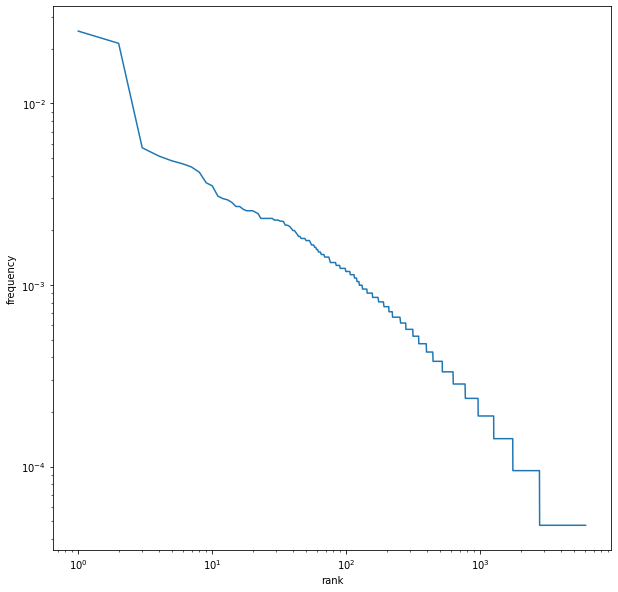

In [ ]:
# plot log-log
a = zip(a)
drawlog(a)

In [ ]:
# bigrams
# count
bigcount(data,2018)

,word1,word2,count
276,I,think,63
188,I,am,60
282,I,was,51
230,I,have,42
284,I,will,39
...,...,...,...
278,I,tried,3
279,I,try,3
283,I,wasn,3
286,I,won,3


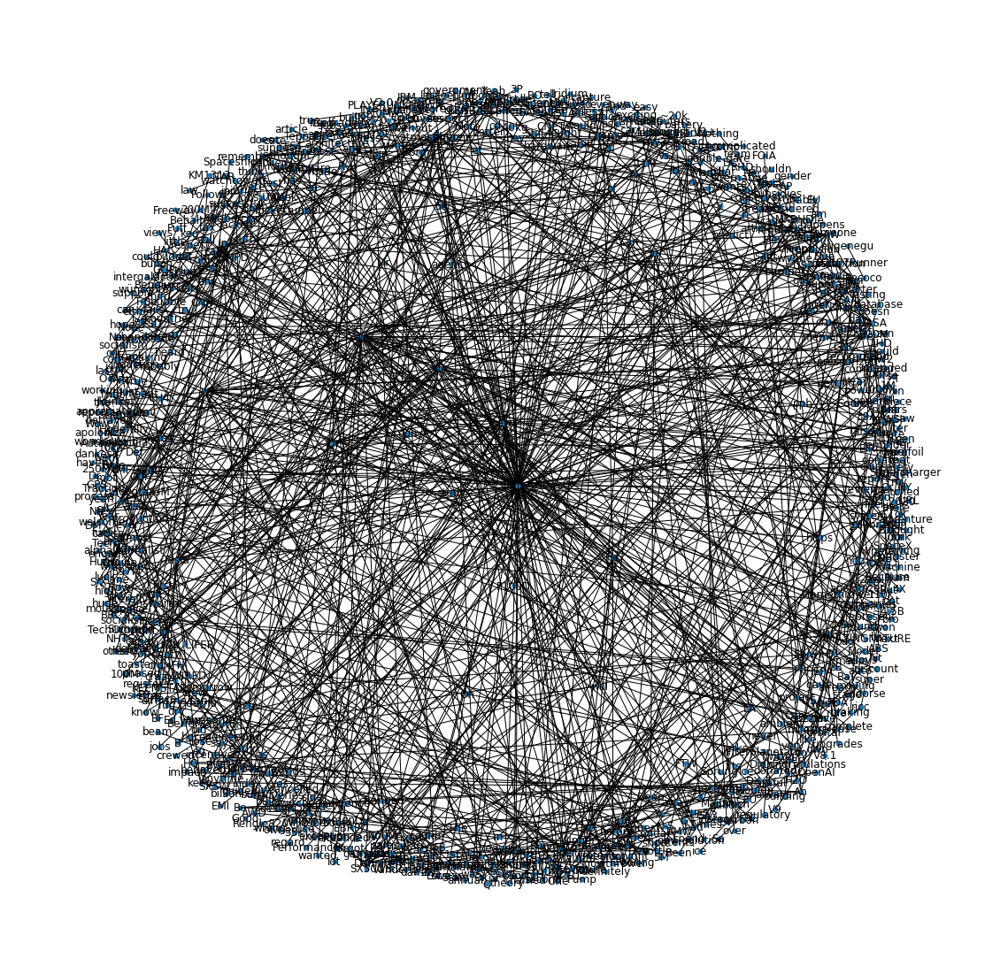

In [ ]:
# visualization
a = bigcount(data,2018)
bivi(a)

### 2019

In [ ]:
# year 2019 word count
wordfre(data,2019)

,word,count
4958,tesla,1130
179,amp,970
1565,erdayastronaut,520
4613,spacex,429
1812,flcnhvy,364
...,...,...
839,classes,1
5563,wirebond,1
5224,tsar,1
2591,jonattenborough,1


In [ ]:
# top 10
wordfre(data,2019)[:10]


,word,count
4958,tesla,1130
179,amp,970
1565,erdayastronaut,520
4613,spacex,429
1812,flcnhvy,364
5623,yes,307
5592,would,198
2070,great,193
4972,teslaownerssv,182
4693,starship,181


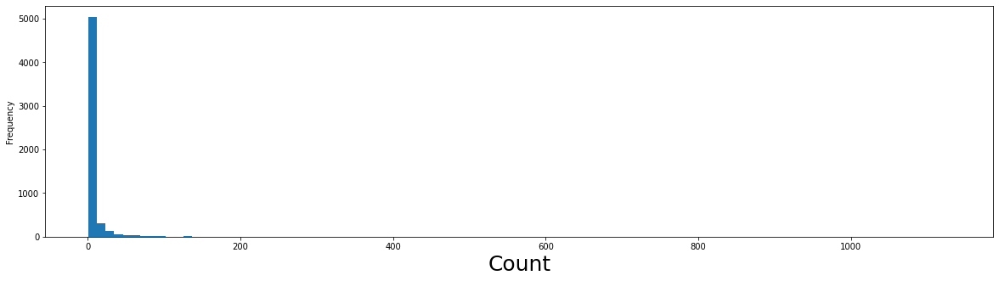

In [ ]:
# hist
a = wordfre(data,2019)
fig, ax = plt.subplots(figsize=(20,5))
ax.hist(a['count'],100 )
ax.set_xlabel("Count",fontsize=25 )
ax.set_ylabel("Frequency")
plt.show()

In [ ]:
# zip laws
a = wordfre(data,2019)
zip(a)

,rank,word,count,frequency
0,1,tesla,1130,0.025778
1,2,amp,970,0.022128
2,3,erdayastronaut,520,0.011863
3,4,spacex,429,0.009787
4,5,flcnhvy,364,0.008304
...,...,...,...,...
5676,5677,classes,1,0.000023
5677,5678,wirebond,1,0.000023
5678,5679,tsar,1,0.000023
5679,5680,jonattenborough,1,0.000023


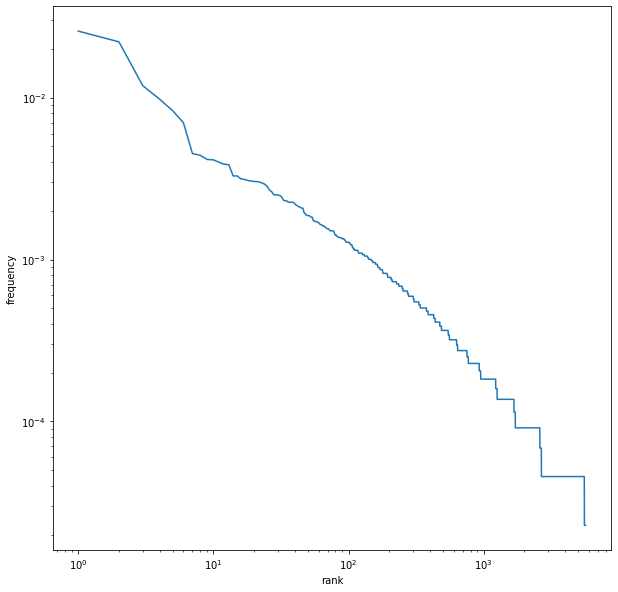

In [ ]:
# plot log-log
a = zip(a)
drawlog(a)

In [ ]:
# bigrams
# count
bigcount(data,2019)

,word1,word2,count
260,I,think,28
295,If,you,27
265,I,was,22
593,We,are,20
622,We,will,19
...,...,...,...
262,I,understand,1
619,We,use,1
439,Our,main,1
373,NASA,Haha,1


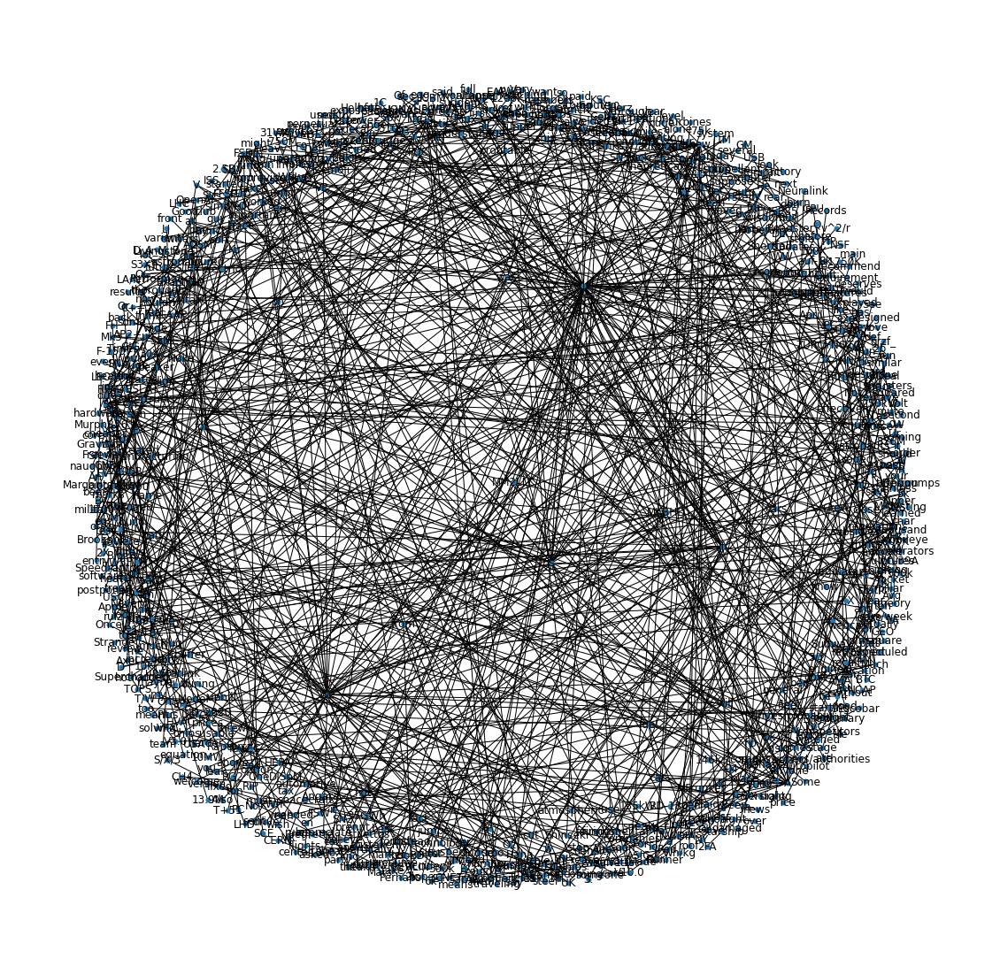

In [ ]:
# visualization
a = bigcount(data,2019)
bivi(a)

### 2020

In [ ]:
# year 2020 word count
wordfre(data,2020)

,word,count
218,amp,578
5451,tesla,347
1770,erdayastronaut,247
2056,flcnhvy,239
4115,ppathole,225
...,...,...
2674,injectors,1
2676,injury,1
2678,inner,1
2681,inquire,1


In [ ]:
# top 10
wordfre(data,2020)[:10]


,word,count
218,amp,578
5451,tesla,347
1770,erdayastronaut,247
2056,flcnhvy,239
4115,ppathole,225
5056,spacex,207
6171,yes,160
2313,great,128
5535,thirdrowtesla,123
3535,much,120


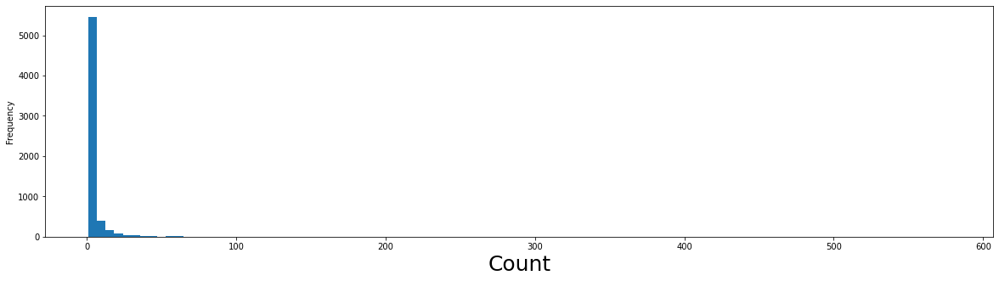

In [ ]:
# hist
a = wordfre(data,2020)
fig, ax = plt.subplots(figsize=(20,5))
ax.hist(a['count'],100 )
ax.set_xlabel("Count",fontsize=25 )
ax.set_ylabel("Frequency")
plt.show()

In [ ]:
# zip laws
a = wordfre(data,2020)
zip(a)

,rank,word,count,frequency
0,1,amp,578,0.022444
1,2,tesla,347,0.013474
2,3,erdayastronaut,247,0.009591
3,4,flcnhvy,239,0.009280
4,5,ppathole,225,0.008737
...,...,...,...,...
6228,6229,injectors,1,0.000039
6229,6230,injury,1,0.000039
6230,6231,inner,1,0.000039
6231,6232,inquire,1,0.000039


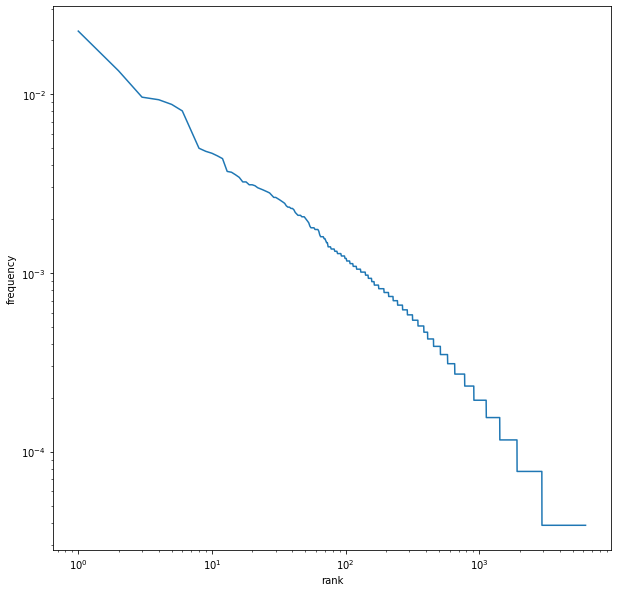

In [ ]:
# plot log-log
a = zip(a)
drawlog(a)

In [ ]:
# bigrams
# count
bigcount(data,2020)

,word1,word2,count
328,I,think,25
743,We,will,18
372,If,you,15
282,I,have,13
335,I,was,13
...,...,...,...
333,I,view,1
336,I,went,1
337,I,whistle,1
339,I,wish,1


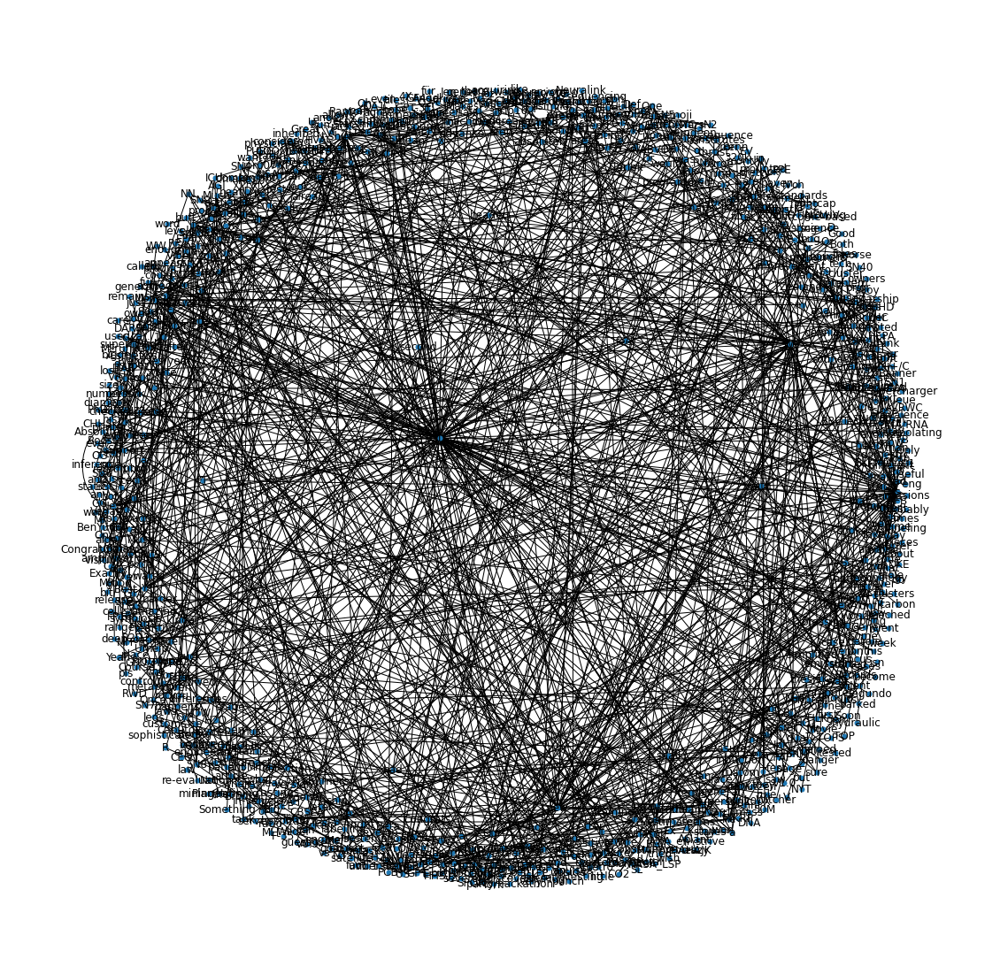

In [ ]:
# visualization
a = bigcount(data,2020)
bivi(a)

### 2021

In [ ]:
# year 2021 word count
wordfre(data,2021)

,word,count
185,amp,476
4968,tesla,327
4618,spacex,237
5522,wholemarsblog,189
4988,teslaownerssv,119
...,...,...
2488,itsgime,1
2490,iv,1
2493,ja,1
2494,jab,1


In [ ]:
# top 10
wordfre(data,2021)[:10]


,word,count
185,amp,476
4968,tesla,327
4618,spacex,237
5522,wholemarsblog,189
4988,teslaownerssv,119
3693,ppathole,116
1575,erdayastronaut,111
2074,great,102
2051,good,98
3176,much,93


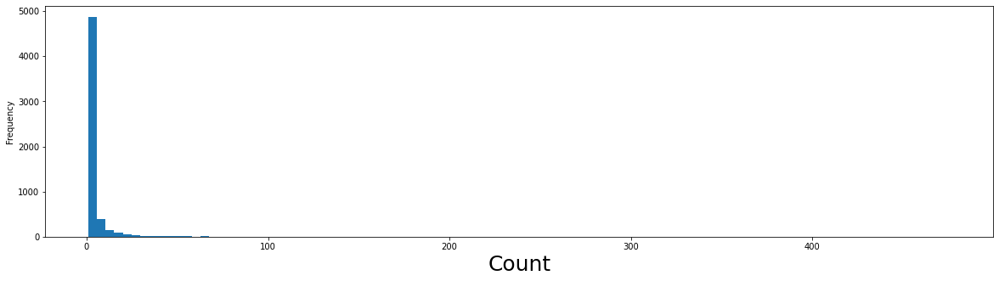

In [ ]:
# hist
a = wordfre(data,2021)
fig, ax = plt.subplots(figsize=(20,5))
ax.hist(a['count'],100 )
ax.set_xlabel("Count",fontsize=25 )
ax.set_ylabel("Frequency")
plt.show()

In [ ]:
# zip laws
a = wordfre(data,2021)
zip(a)

,rank,word,count,frequency
0,1,amp,476,0.020944
1,2,tesla,327,0.014388
2,3,spacex,237,0.010428
3,4,wholemarsblog,189,0.008316
4,5,teslaownerssv,119,0.005236
...,...,...,...,...
5675,5676,itsgime,1,0.000044
5676,5677,iv,1,0.000044
5677,5678,ja,1,0.000044
5678,5679,jab,1,0.000044


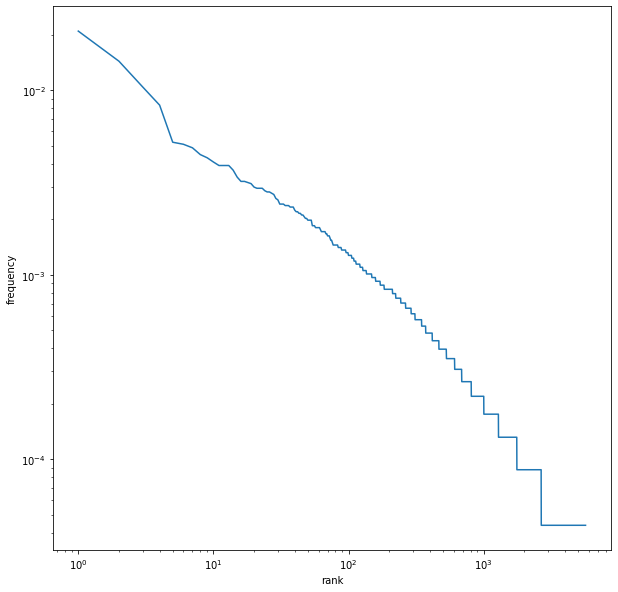

In [ ]:
# plot log-log
a = zip(a)
drawlog(a)

In [ ]:
# bigrams
# count
bigcount(data,2021)

,word1,word2,count
324,I,was,17
268,I,have,16
616,We,are,15
279,I,love,14
326,I,will,13
...,...,...,...
271,I,imagine,1
273,I,keep,1
277,I,liked,1
278,I,look,1


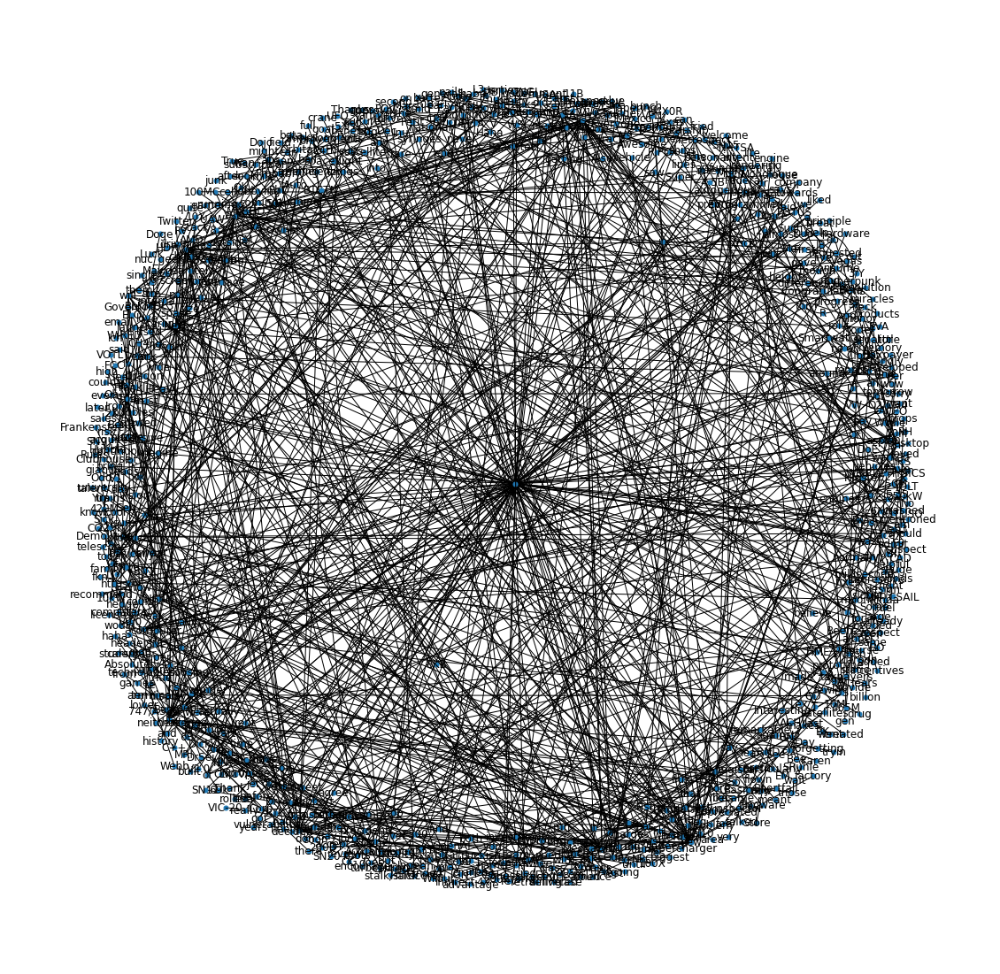

In [ ]:
# visualization
a = bigcount(data,2021)
bivi(a)

### 2022

In [ ]:
# year 2022 word count
wordfre(data,2022)

,word,count
1399,tesla,108
1581,wholemarsblog,84
46,amp,80
1300,spacex,58
1412,teslaownerssv,50
...,...,...
643,horror,2
641,hoping,2
640,hopefully,2
636,holy,2


In [ ]:
# top 10
wordfre(data,2022)[:10]


,word,count
1399,tesla,108
1581,wholemarsblog,84
46,amp,80
1300,spacex,58
1412,teslaownerssv,50
1206,sawyermerritt,36
1003,people,34
1608,would,32
1619,yes,32
947,one,30


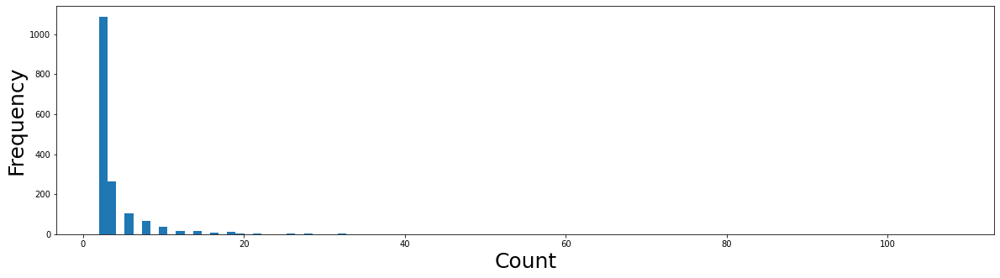

In [ ]:
# hist
a = wordfre(data,2022)
fig, ax = plt.subplots(figsize=(20,5))
ax.hist(a['count'],100 )
ax.set_xlabel("Count",fontsize=25 )
ax.set_ylabel("Frequency",fontsize=25)
plt.show()

In [ ]:
# zip laws
a = wordfre(data,2022)
zip(a)

,rank,word,count,frequency
0,1,tesla,108,0.017319
1,2,wholemarsblog,84,0.013470
2,3,amp,80,0.012829
3,4,spacex,58,0.009301
4,5,teslaownerssv,50,0.008018
...,...,...,...,...
1623,1624,horror,2,0.000321
1624,1625,hoping,2,0.000321
1625,1626,hopefully,2,0.000321
1626,1627,holy,2,0.000321


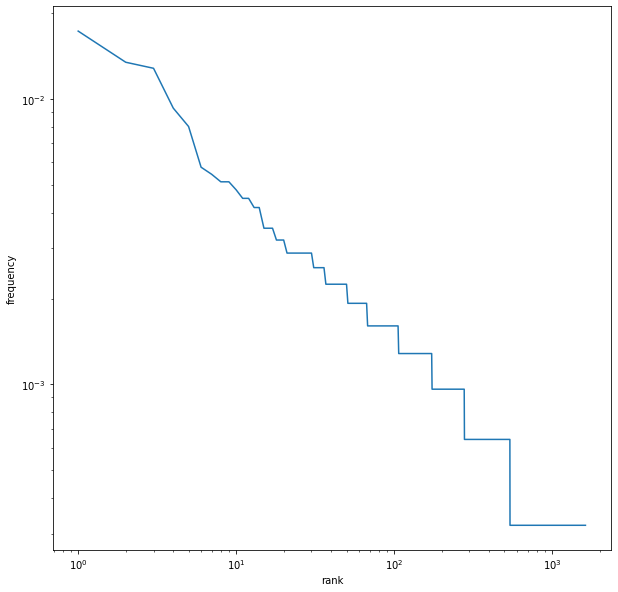

In [ ]:
# plot log-log
a = zip(a)
drawlog(a)

In [ ]:
# bigrams
# count
bigcount(data,2022)

,word1,word2,count
43,I,have,8
58,I,was,6
59,I,will,6
132,X,is,4
42,I,don,4
...,...,...,...
45,I,hex,2
44,I,hear,2
39,I,could,2
38,I,can,2


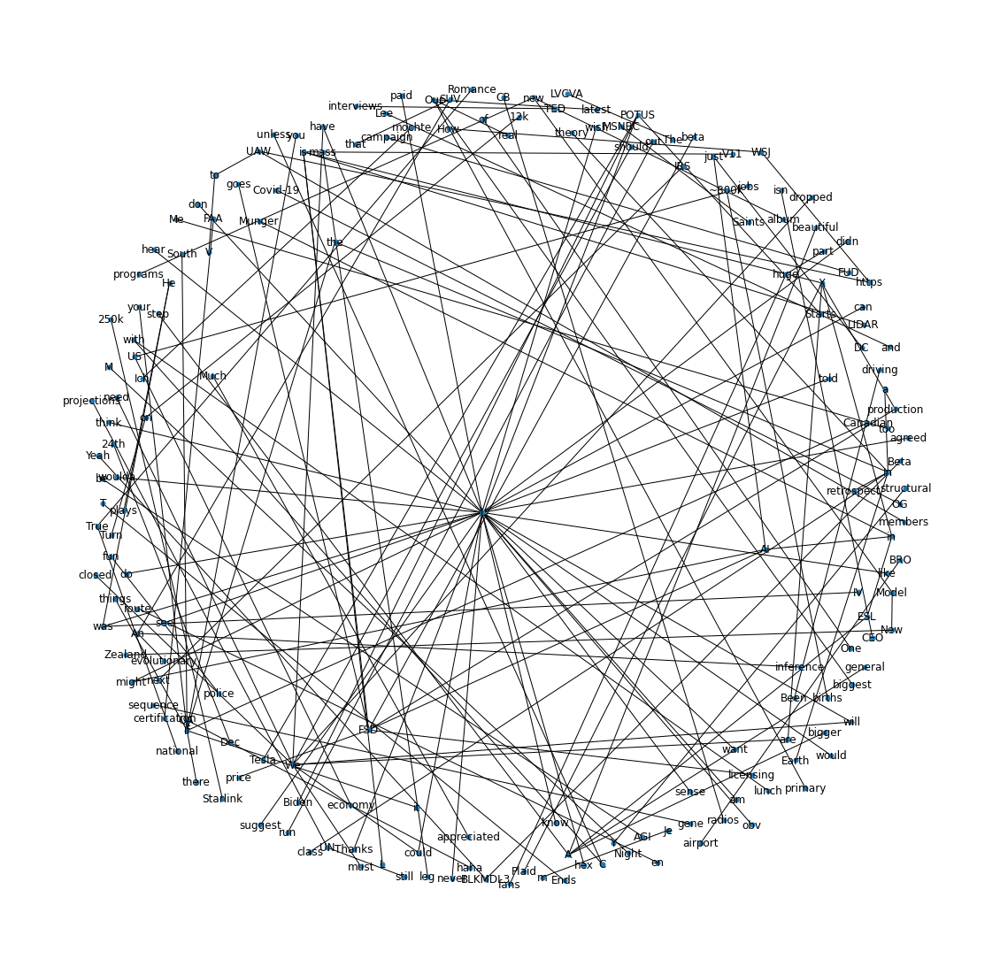

In [ ]:
# visualization
a = bigcount(data,2022)
bivi(a)

In [ ]:
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb